In [1]:
# imports 
from imageai.Detection import ObjectDetection

import cv2

import matplotlib.pyplot as plt

from PIL import Image, ImageEnhance

import os


In [2]:
detector = ObjectDetection()

In [3]:
model_path = "./models/retinanet.pth"

input_path = "./input/test.jpg"

output_path = "./output/newimage.jpg"

In [10]:
# bottle images
b1 = './input/bottle/B1.jpg'
b2 = './input/bottle/B2.jpg'
b3 = './input/bottle/B3.jpg'
b4 = './input/bottle/B4.jpg'
b5 = './input/bottle/B5.jpg'
b6 = './input/bottle/B6.jpg'

nametags = ['B1.jpg', 'B2.jpg', 'B3.jpg', 'B4.jpg', 'B5.jpg', 'B6.jpg']

brightness_threshold = 100

# resize 

# resize = 0.6

# t1 = Image.open(b1)
# b1 = t1.resize((int(t1.width*resize), int(t1.height*resize)))

# t2 = Image.open(b2)
# b2 = t2.resize((int(t2.width*resize), int(t2.height*resize)))

# t3 = Image.open(b3)
# b3 = t3.resize((int(t3.width*resize), int(t3.height*resize)))

# t4 = Image.open(b4)
# b4 = t4.resize((int(t4.width*resize), int(t4.height*resize)))

# t5 = Image.open(b5)
# b5 = t5.resize((int(t5.width*resize), int(t5.height*resize)))

# t6 = Image.open(b6)
# b6 = t6.resize((int(t6.width*resize), int(t6.height*resize)))


In [6]:
def darkdetector(image_path, threshold):
    image = Image.open(image_path).convert('L')
    width, height = image.size
    pixels = image.getdata()
    
    total_brightness = sum(pixels)
    average_brightness = total_brightness / (width * height)
    
    return average_brightness < threshold

def enhancer(image_path, brightness_threshold, saturation_factor, contrast_factor):
    image = Image.open(image_path)
    
    enhancer = ImageEnhance.Brightness(image)
    image = enhancer.enhance(brightness_threshold)
    
    enhancer = ImageEnhance.Color(image)
    image = enhancer.enhance(saturation_factor)
    
    enchaner = ImageEnhance.Contrast(image)
    image = enchaner.enhance(contrast_factor)
    
    return image

In [17]:
num_iterations = 10
input = 'input/bottle/'
output = 'output/'

previous_images = {}  # Dictionary to store the previous enhanced images

for _ in range(num_iterations):
    for filename in nametags:
        # Apply darkdetector
        is_dark = darkdetector(os.path.join(input, filename), 50)  # Assuming 50 as the threshold, you can adjust it as needed
        
        if is_dark:
            if filename in previous_images:
                # Remove the previous enhanced image from the output folder
                previous_filepath = os.path.join(output, previous_images[filename])
                os.remove(previous_filepath)
                print(f"Previous enhanced image {previous_images[filename]} removed.")
            
            # Apply enhancer to the current image
            enhanced_image = enhancer(os.path.join(input, filename), 1.5, 1.2, 1.3)  # Assuming the enhancement factors, you can adjust them as needed
            
            # Generate a new filename for the enhanced image
            new_filename = filename
            new_filepath = os.path.join(output, new_filename)
            
            # Save the enhanced image to the output folder
            enhanced_image.save(new_filepath)
            
            # Update the previous_images dictionary with the new enhanced image filename
            previous_images[filename] = new_filename
            
            print(f"Enhanced image saved as {new_filename}")
        else:
            # Check if the non-dark image is already in the output folder
            output_filepath = os.path.join(output, filename)
            if not os.path.exists(output_filepath):
                # Copy the non-dark image to the output folder
                input_filepath = os.path.join(input, filename)
                os.link(input_filepath, output_filepath)
                print(f"{filename} is not dark. Copied to the output folder.")
            else:
                print(f"{filename} is not dark. Already in the output folder.")

B1.jpg is not dark. Copied to the output folder.
Enhanced image saved as B2.jpg
B3.jpg is not dark. Copied to the output folder.
Enhanced image saved as B4.jpg
B5.jpg is not dark. Copied to the output folder.
Enhanced image saved as B6.jpg
B1.jpg is not dark. Already in the output folder.
Previous enhanced image B2.jpg removed.
Enhanced image saved as B2.jpg
B3.jpg is not dark. Already in the output folder.
Previous enhanced image B4.jpg removed.
Enhanced image saved as B4.jpg
B5.jpg is not dark. Already in the output folder.
Previous enhanced image B6.jpg removed.
Enhanced image saved as B6.jpg
B1.jpg is not dark. Already in the output folder.
Previous enhanced image B2.jpg removed.
Enhanced image saved as B2.jpg
B3.jpg is not dark. Already in the output folder.
Previous enhanced image B4.jpg removed.
Enhanced image saved as B4.jpg
B5.jpg is not dark. Already in the output folder.
Previous enhanced image B6.jpg removed.
Enhanced image saved as B6.jpg
B1.jpg is not dark. Already in the

In [15]:
detector.setModelTypeAsRetinaNet()
detector.setModelPath(model_path)
detector.loadModel() 

e:\python\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\python\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
e:\python\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
e:\python\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=None`.
  warnings.warn

In [53]:
# detection on one image
detections = detector.detectObjectsFromImage(input_image=input_path, 
                                             output_image_path=output_path, 
                                             minimum_percentage_probability=30)

# if detections:
#     # Display the output image
#     print("Objects detected.")
#     for eachItem in detections:
#         print(eachItem["name"] , " : ", eachItem["percentage_probability"], " : ", eachItem["box_points"] )
# else:
#     print("No objects detected.")


In [18]:
for i in range(1,7):

    # detection on one image
    detections = detector.detectObjectsFromImage(input_image=eval('b'+str(i)), 
                                                 output_image_path='./output/b'+str(i)+'.jpg', 
                                                 minimum_percentage_probability=30)

    # Display the output image
    print("Objects detected.")
    for eachItem in detections:
        print(eachItem["name"] , " : ", eachItem["percentage_probability"])
    else:
        print("No objects detected.")

Objects detected.
bottle  :  89.48
bottle  :  88.4
bottle  :  87.77
sports ball  :  77.79
remote  :  68.69
mouse  :  67.98
scissors  :  58.02
No objects detected.
Objects detected.
bottle  :  90.77
bottle  :  82.85
bottle  :  81.17
mouse  :  80.28
sports ball  :  71.59
remote  :  51.4
No objects detected.
Objects detected.
bottle  :  87.39
remote  :  85.44
bottle  :  85.2
bottle  :  82.61
sports ball  :  81.49
scissors  :  58.64
No objects detected.
Objects detected.
bottle  :  84.33
bottle  :  70.03
bottle  :  65.01
mouse  :  63.43
remote  :  58.21
bottle  :  51.34
No objects detected.
Objects detected.
bottle  :  88.83
bottle  :  88.58
bottle  :  81.92
scissors  :  73.5
mouse  :  68.83
remote  :  68.76
sports ball  :  58.27
No objects detected.
Objects detected.
mouse  :  90.43
bottle  :  86.69
bottle  :  85.64
bottle  :  79.8
sports ball  :  58.01
No objects detected.


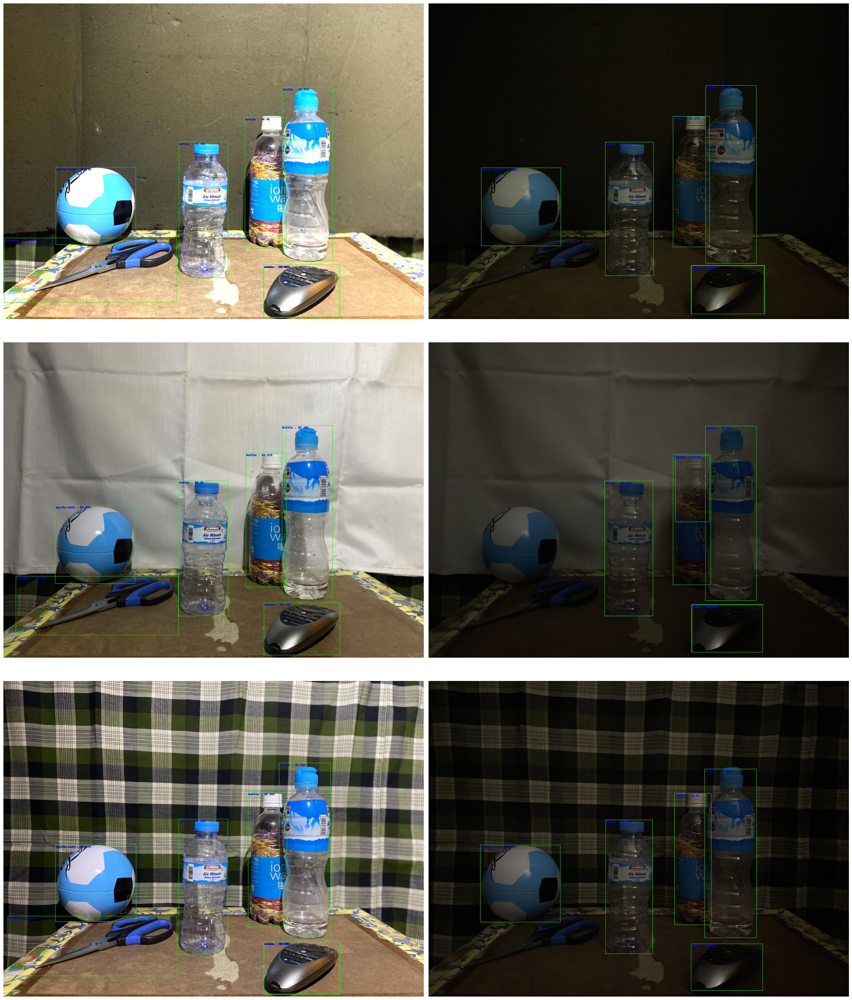

In [19]:

fig = plt.figure(figsize=(25,30))

ax1 = fig.add_subplot(321)
ax1.imshow(plt.imread('./output/b1.jpg'))
ax1.axis('off')

ax2 = fig.add_subplot(322)
ax2.imshow(plt.imread('./output/b2.jpg'))
ax2.axis('off')

ax3 = fig.add_subplot(323)
ax3.imshow(plt.imread('./output/b3.jpg'))
ax3.axis('off')

ax4 = fig.add_subplot(324)
ax4.imshow(plt.imread('./output/b4.jpg'))
ax4.axis('off')

ax5 = fig.add_subplot(325)
ax5.imshow(plt.imread('./output/b5.jpg'))
ax5.axis('off')

ax6 = fig.add_subplot(326)
ax6.imshow(plt.imread('./output/b6.jpg'))
ax6.axis('off')

plt.tight_layout()
plt.show()

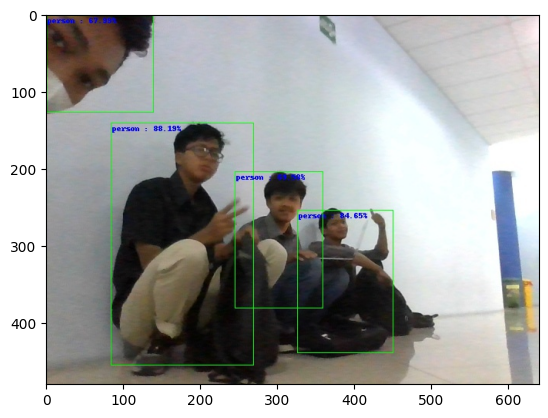

In [51]:
input_image = plt.imread(input_path)
output_image = plt.imread(output_path)

# fig, ax = plt.subplots(1, 2, figsize=(20, 10))
# ax[0].imshow(input_image)
# ax[1].imshow(output_image)

# show output image in fullsize
plt.imshow(output_image)